In [1]:
import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

In [2]:
import numpy as np
import wave
from thinkdsp import read_wave
import matplotlib.pyplot as plt
from scipy.io import wavfile

對鋼琴的音訊進行分析及取樣

In [3]:
# 分析前先聽鋼琴音訊(以此音訊可清楚聽到存在不同聲道)
piano = read_wave('piano.wav')
piano.normalize()
piano.make_audio() 

In [4]:
piano = wave.open(r"piano.wav", "rb") 
params_p = piano.getparams() # 讀取格式資訊
nchannels, sampwidth, framerate, nframes = params_p[:4] # 聲道數、量化位數、取樣頻率、取樣點數
params_p

_wave_params(nchannels=2, sampwidth=2, framerate=44100, nframes=1095150, comptype='NONE', compname='not compressed')

In [5]:
str_pdata = piano.readframes(nframes) # 讀取"取樣點數"個數據，返回字串格式
piano.close()

In [6]:
wave_pdata = np.frombuffer(str_pdata, dtype=np.short) # 將字串轉換為陣列，得到一維的short型別的陣列

wave_pdata = wave_pdata*1.0/(max(abs(wave_pdata))) # 賦值的歸一化(使得數據被限定在一定的範圍內，以消除其他樣本數據導致的不良影響)

wave_pdata = np.reshape(wave_pdata,[nframes,nchannels]) # 整合左聲道和右聲道的資料

time = np.arange(0, nframes) * (1.0 / framerate) # 通過取樣點數和取樣頻率計算出每個取樣的時間

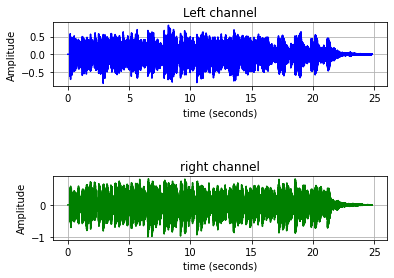

In [7]:
plt.figure()

# 左聲道波形
plt.subplot(3,1,1)
plt.plot(time, wave_pdata[:,0], c="b")
plt.xlabel("time (seconds)")
plt.ylabel("Amplitude")
plt.title("Left channel")
plt.grid()

# 右聲道波形
plt.subplot(3,1,3)
plt.plot(time, wave_pdata[:,1], c="g")
plt.xlabel("time (seconds)")
plt.ylabel("Amplitude")
plt.title("Left channel")
plt.title("right channel")
plt.grid()

plt.show() #由圖可表示存在兩聲道

In [8]:
sampling_freq, audio_p = wavfile.read(r"piano.wav")

audio_p = audio_p / np.max(audio_p)   # 歸一化，標準化

fft_signal = np.fft.fft(audio_p) # 傅立葉變換
print(fft_signal)

Freq = np.arange(0, len(fft_signal)) # 建立時間軸

[[0.        +0.j 0.        +0.j]
 [0.        +0.j 0.        +0.j]
 [0.        +0.j 0.        +0.j]
 ...
 [0.00453741+0.j 0.00299931+0.j]
 [0.0043067 +0.j 0.0029224 +0.j]
 [0.00415289+0.j 0.00307621+0.j]]


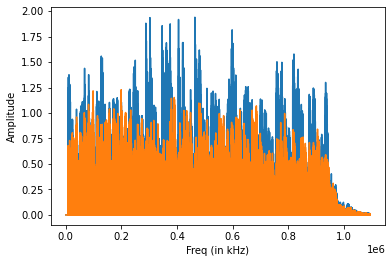

In [9]:
# 繪製訊號頻譜圖
plt.figure()
plt.plot(Freq, abs(fft_signal))
plt.xlabel('Freq (in kHz)')
plt.ylabel('Amplitude')
plt.show()

對薩克斯風的音訊進行分析及取樣

In [10]:
# 分析前先聽薩克斯風音訊(以此音訊無法清楚聽到存在不同聲道)
saxophone = read_wave('saxophone.wav')
saxophone.normalize()
saxophone.make_audio() 

In [11]:
saxophone = wave.open(r"saxophone.wav", "rb")
params_s = saxophone.getparams() # 讀取格式資訊
nchannels, sampwidth, framerate, nframes = params_s[:4] #聲道數、量化位數、取樣頻率、取樣點數
params_s

_wave_params(nchannels=2, sampwidth=2, framerate=44100, nframes=3849489, comptype='NONE', compname='not compressed')

In [12]:
str_sdata = saxophone.readframes(nframes) # 讀取"取樣點數"個數據，返回字串格式
saxophone.close()

In [13]:
wave_sdata = np.frombuffer(str_sdata, dtype=np.short) #將字串轉換為陣列，得到一維的short型別的陣列

wave_sdata = wave_sdata*1.0/(max(abs(wave_sdata))) # 賦值的歸一化(使得數據被限定在一定的範圍內，以消除其他樣本數據導致的不良影響)

wave_sdata = np.reshape(wave_sdata,[nframes,nchannels]) # 整合左聲道和右聲道的資料

time = np.arange(0, nframes) * (1.0 / framerate) # 通過取樣點數和取樣頻率計算出每個取樣的時間

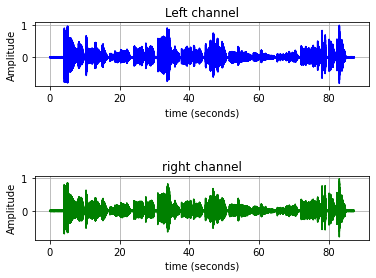

In [14]:
plt.figure()

# 左聲道波形
plt.subplot(3,1,1)
plt.plot(time, wave_sdata[:,0], c="b")
plt.xlabel("time (seconds)")
plt.ylabel("Amplitude")
plt.title("Left channel")
plt.grid()

# 右聲道波形
plt.subplot(3,1,3)
plt.plot(time, wave_sdata[:,1], c="g")
plt.xlabel("time (seconds)")
plt.ylabel("Amplitude")
plt.title("Left channel")
plt.title("right channel")
plt.grid()

plt.show() #由圖可表示雖然聽音訊時無法僅為薩克斯風獨奏,但仍存在兩聲道

In [15]:
sampling_freq, audio_s = wavfile.read(r"saxophone.wav")

audio_s = audio_s / np.max(audio_s)   # 歸一化，標準化

fft_signal = np.fft.fft(audio_s) # 傅立葉變換
print(fft_signal)

Freq = np.arange(0, len(fft_signal)) # 建立時間軸

[[-1.04372959e-02+0.j -5.35245946e-05+0.j]
 [-1.07584435e-02+0.j -5.35245946e-05+0.j]
 [-1.09190173e-02+0.j -1.07049189e-04+0.j]
 ...
 [-5.99475459e-03+0.j  6.42295135e-04+0.j]
 [-6.04827918e-03+0.j  8.02868918e-04+0.j]
 [-6.26237756e-03+0.j  6.95819729e-04+0.j]]


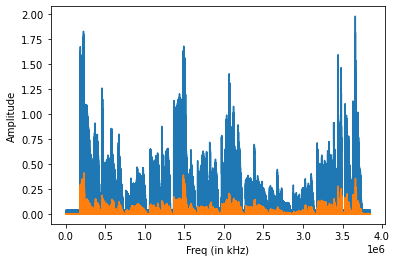

In [16]:
# 繪製訊號頻譜圖
plt.figure()
plt.plot(Freq, abs(fft_signal))
plt.xlabel('Freq (in kHz)')
plt.ylabel('Amplitude')
plt.show()

匯入較複雜的音訊進行分析及取樣

In [17]:
# 分析前先聽交響音訊(以此音訊可聽到嘈雜聲)
mono = read_wave('mono.wav')
mono.normalize()
mono.make_audio() 

In [18]:
mono = wave.open(r"mono.wav", "rb") 
params_m = mono.getparams() # 讀取格式資訊
nchannels, sampwidth, framerate, nframes = params_m[:4] #聲道數、量化位數、取樣頻率、取樣點數
params_m

_wave_params(nchannels=1, sampwidth=2, framerate=44100, nframes=297236, comptype='NONE', compname='not compressed')

In [19]:
str_mdata = mono.readframes(nframes) # 讀取"取樣點數"個數據，返回字串格式
mono.close()

In [20]:
wave_mdata = np.frombuffer(str_mdata, dtype=np.short) #將字串轉換為陣列，得到一維的short型別的陣列

wave_mdata = wave_mdata*1.0/(max(abs(wave_mdata))) # 賦值的歸一化(使得數據被限定在一定的範圍內，以消除其他樣本數據導致的不良影響)

wave_mdata = np.reshape(wave_mdata,[nframes,nchannels]) # 整合聲道的資料

time = np.arange(0, nframes) * (1.0 / framerate) # 通過取樣點數和取樣頻率計算出每個取樣的時間

IndexError: index 1 is out of bounds for axis 1 with size 1

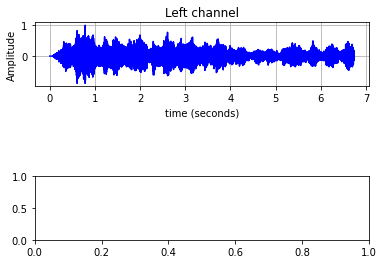

In [21]:
plt.figure()

# 左聲道波形
plt.subplot(3,1,1)
plt.plot(time, wave_mdata[:,0], c="b")
plt.xlabel("time (seconds)")
plt.ylabel("Amplitude")
plt.title("Left channel")
plt.grid()

# 右聲道波形
plt.subplot(3,1,3)
plt.plot(time, wave_mdata[:,1], c="g")
plt.xlabel("time (seconds)")
plt.ylabel("Amplitude")
plt.title("Left channel")
plt.title("right channel")
plt.grid()

plt.show() #由圖可表示雖然聽音訊時非常嘈雜,但仍為單聲道

In [22]:
sampling_freq, audio_m = wavfile.read(r"mono.wav") 

audio_m = audio_m / np.max(audio_m)   # 歸一化，標準化

fft_signal = np.fft.fft(audio_m) # 傅立葉變換
print(fft_signal)

Freq = np.arange(0, len(fft_signal)) # 建立時間軸

[-10.98171193-6.66133815e-16j  13.74514959+5.98149036e+00j
  -0.07373117+2.20082829e+00j ...  12.90320357-3.66137233e+00j
  -0.07373117-2.20082829e+00j  13.74514959-5.98149036e+00j]


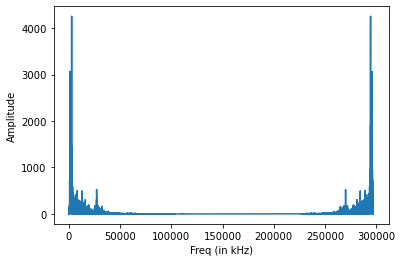

In [23]:
# 繪製訊號頻譜圖
plt.figure()
plt.plot(Freq, abs(fft_signal))
plt.xlabel('Freq (in kHz)')
plt.ylabel('Amplitude')
plt.show()

In [ ]:
sampling_freq, audio_s = wavfile.read(r"saxophone.wav")

audio_s = audio_s / np.max(audio_s)   # 歸一化，標準化

fft_signal = np.fft.fft(audio_s) # 傅立葉變換
print(fft_signal)

Freq = np.arange(0, len(fft_signal)) # 建立時間軸